<a href="https://colab.research.google.com/github/w12l3-c/Pneumonia_Classification/blob/main/Pneumonia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

I will force myself to use Pytorch and ViT

# Kaggle Import Datasets

In [ ]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"wallacel","key":"d4846c13171812a348c366972bd73a6b"}'}

In [ ]:
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d paultimothymooney/chest-xray-pneumonia

100% 2.29G/2.29G [00:17<00:00, 162MB/s]
100% 2.29G/2.29G [00:17<00:00, 142MB/s]


In [ ]:
! unzip chest-xray-pneumonia.zip

# Libraries

In [ ]:
! pip install -q transformers
! pip install -q hugsvision
! pip install datasets
! pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 67.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 94.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.8/199.8 KB 24.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 KB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.6/715.6 KB 47.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 KB 49.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 38.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 KB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 KB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 KB 13.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 469.0/469.0 KB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━

In [ ]:
import torch
import torch.nn as nn
import torch.functional as F
import torch.optim as optim
import torchvision
from torchvision import transforms
from torchvision.transforms import (CenterCrop, Compose, Normalize, RandomHorizontalFlip,RandomResizedCrop, Resize, ToTensor)
from torch.utils.data import DataLoader
from torchvision.io import read_image
from torch.utils.data import Dataset

import hugsvision
from hugsvision.dataio.VisionDataset import VisionDataset
from hugsvision.nnet.VisionClassifierTrainer import VisionClassifierTrainer

import timm
from datasets import load_dataset

import PIL 
from PIL import Image

import os
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt

import transformers
from transformers import ViTImageProcessor
from transformers import ViTFeatureExtractor
from transformers import ViTForImageClassification
from transformers import TrainingArguments, Trainer
from transformers import BeitImageProcessor, BeitForImageClassification # I will try this when I'm done

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

/usr/local/lib/python3.9/dist-packages/torchvision/transforms/transforms.py:329: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/transforms/transforms.py:329: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(


# Dataset
The dataset are already labelled and split

In [ ]:
root = "/content/chest_xray/chest_xray"
ntest = os.path.join(root, "test/NORMAL")
ptest = os.path.join(root, "test/PNEUMONIA")
ntrain = os.path.join(root, "train/NORMAL")
ptrain = os.path.join(root, "train/PNEUMONIA")
nval = os.path.join(root, "val/NORMAL")
pval = os.path.join(root, "val/PNEUMONIA")

In [ ]:
data_transforms = transforms.Compose([
    transforms.Resize((512,512)),
    RandomHorizontalFlip,
    transforms.ToTensor()
])
test_ds = torchvision.datasets.ImageFolder(os.path.join(root, "test"), transform=data_transforms)
train_ds = torchvision.datasets.ImageFolder(os.path.join(root, "train"), transform=data_transforms)
val_ds = torchvision.datasets.ImageFolder(os.path.join(root, "val"), transform=data_transforms)

In [ ]:
train_loader = torch.utils.data.DataLoader(train_ds, batch_size=32, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_ds, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_ds, batch_size=32, shuffle=True)

In [ ]:
labels = train_ds.classes

['NORMAL', 'PNEUMONIA']

In [ ]:
class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = sorted(os.listdir(root_dir))
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.image_files[idx])
        image = Image.open(img_path).convert("RGB")
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(idx)

# Preprocess

In [ ]:
processor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")

In [ ]:
processor

ViTImageProcessor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [ ]:
image_mean, image_std = processor.image_mean, processor.image_std
print(f"Image mean: {image_mean}")
print(f"Image std: {image_std}")

Image mean: [0.5, 0.5, 0.5]
Image std: [0.5, 0.5, 0.5]


In [ ]:
class Rescale:
    def __init__(self, output_size):
        assert isinstance(output_size, (int, tuple))
        self.output_size = output_size

    def __call__(self, image):
        h, w = image.shape[:2]
        if isinstance(self.output_size, int):
            if h > w:
                new_h, new_w = self.output_size * h / w, self.output_size
            else:
                new_h, new_w = self.output_size, self.output_size * w / h
        else:
            new_h, new_w = self.output_size

        new_h, new_w = int(new_h), int(new_w)
        img = Resize((new_h, new_w))(image)
        return img

In [ ]:
size = processor.size["height"]

normalize = Normalize(mean=image_mean, std=processor.image_std)
train_transform = Compose([
    Resize((size,size)),
    RandomHorizontalFlip(),
    ToTensor(),
    # normalize
])
test_transform = Compose([
    Resize((size,size)),
    ToTensor(),
    # normalize
])
val_transform = Compose([
    Resize((size,size)),
    ToTensor(),
    # normalize
])

# I have to sacrifice normalizing as this my dipshit brain don't know how to deal with the PIL image converting problem

In [ ]:
test_ds = torchvision.datasets.ImageFolder(os.path.join(root, "test"), transform=test_transform)
train_ds = torchvision.datasets.ImageFolder(os.path.join(root, "train"), transform=train_transform)
val_ds = torchvision.datasets.ImageFolder(os.path.join(root, "val"), transform=val_transform)

In [ ]:
train_ds

Dataset ImageFolder
    Number of datapoints: 5216
    Root location: /content/chest_xray/chest_xray/train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=None)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )

In [ ]:
def collate_fn(batch):
    # Pad the images to the same size
    batch = [(torch.nn.functional.pad(sample[0], (0, 224 - sample[0].shape[-1], 0, 224 - sample[0].shape[-2]), mode='constant', value=0), sample[1]) for sample in batch]
    # Stack the images and targets
    images, targets = zip(*batch)
    inputs = processor(images, return_tensors='pt', padding=True)
    inputs['labels'] = torch.tensor(targets)
    return inputs
    # return {"pixel_values": images, "labels": targets}
    # return images, targets

In [ ]:
train_loader = torch.utils.data.DataLoader(train_ds, batch_size=16, collate_fn=collate_fn, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_ds, batch_size=16, collate_fn=collate_fn, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_ds, batch_size=16, collate_fn=collate_fn, shuffle=True)
# Put the dataloader into cuda.device

In [ ]:
batch = next(iter(train_loader))
print(batch)

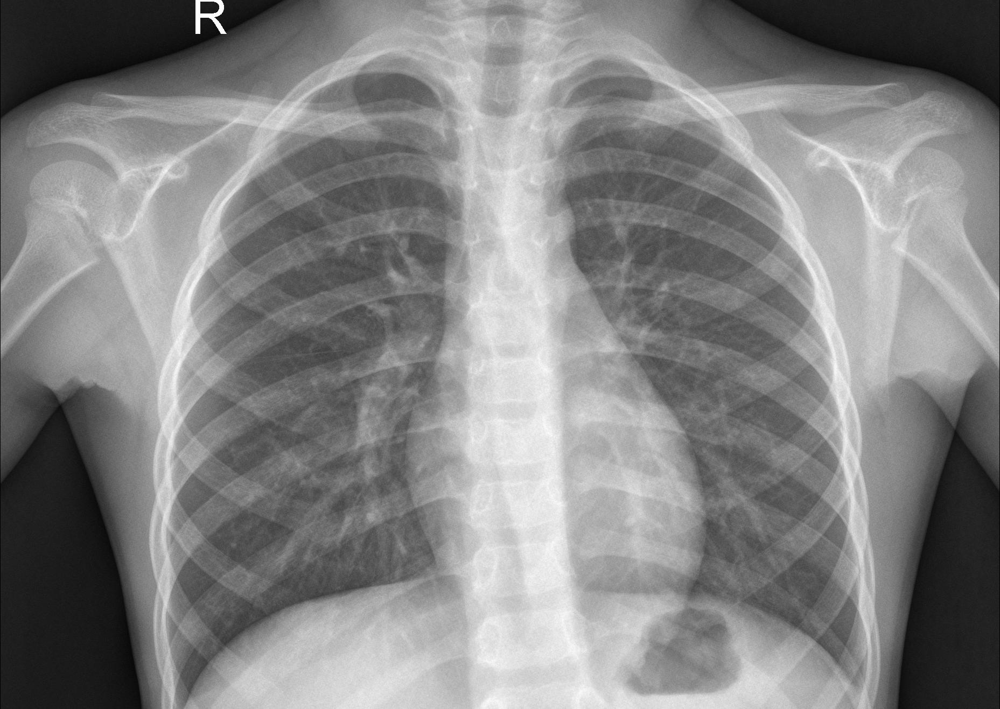

In [ ]:
# Original Image
img = Image.open("/content/chest_xray/test/NORMAL/IM-0001-0001.jpeg")
img.show()

In [ ]:
img.mode

'L'

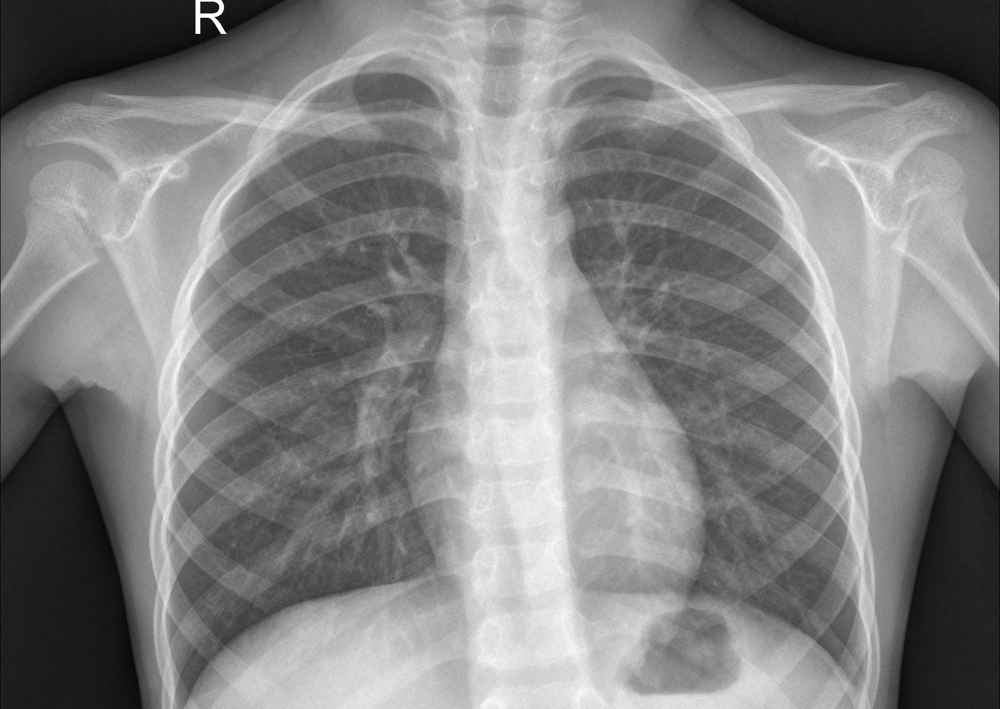

In [ ]:
rgb = img.convert("RGB")
rgb.show()

In [ ]:
rgb.mode

'RGB'

In [ ]:
img.size

(1857, 1317)

In [ ]:
image, target = train_ds[0]

In [ ]:
image

In [ ]:
image.shape

torch.Size([3, 224, 224])

# Model

In [ ]:
id2label = {0:'NORMAL', 1:'PNUEMONIA'}
label2id = {label:id for id, label in id2label.items()}

In [ ]:
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224-in21k',
                                                  id2label=id2label,
                                                  label2id=label2id,
                                                  ignore_mismatched_sizes = True)
device = torch.device("cuda")
model.to(device)

In [ ]:
# This is not used as this is for older person
feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224-in21k")

In [ ]:
metric_name = "accuracy"

args = TrainingArguments(
    f"Pneumonia",
    save_strategy="epoch",
    evaluation_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    weight_decay=0.01,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    logging_dir='logs',
    remove_unused_columns=False,
)

In [ ]:
def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return dict(accuracy=accuracy_score(predictions, labels))

In [ ]:
trainer = Trainer(
    model,
    args,
    train_dataset=train_ds,
    eval_dataset=val_ds,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    tokenizer=processor,
)

# Traininggggggggggg
I am going nuts now

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/

<IPython.core.display.Javascript object>

In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,No log,0.070674,1.000000


Epoch,Training Loss,Validation Loss,Accuracy
1,No log,0.070674,1.000000


# Evaluate

In [ ]:
outputs = trainer.predict(test_ds)

In [ ]:
print(outputs.metrics)

In [ ]:
y_true = outputs.label_ids
y_pred = outputs.predictions.argmax(1)

In [ ]:
target_names = ['NORMAL', 'PNEUMONIA']
print(classification_report(y_true, y_pred, target_names=target_names))

In [ ]:
labels = train_ds.features['label'].names
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(xticks_rotation=45)